<a href="https://colab.research.google.com/github/felfrom/GEOL0069/blob/Final-Project/GPsat_interpolation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#GEOL0069: Artificial Intelligence For Earth Observation Final Project

#**GPsat**


###Mount google drive

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


###Prepare the session for GPsat

In [2]:
try:
    import google.colab
    IN_COLAB = True
except:
    IN_COLAB = False

# TODO: allow for mounting of gdrive
# TODO: allow for checking out a branch

if IN_COLAB:

    import os
    import re

    # change to working directory
    work_dir = "/content"

    assert os.path.exists(work_dir), f"workspace directory: {work_dir} does not exist"
    os.chdir(work_dir)

    # clone repository
    !git clone https://github.com/CPOMUCL/GPSat.git

    repo_dir = os.path.join(work_dir, "GPSat")

    print(f"changing directory to: {repo_dir}")
    os.chdir(repo_dir)

fatal: destination path 'GPSat' already exists and is not an empty directory.
changing directory to: /content/GPSat


In [ ]:
if IN_COLAB:
    !pip install -r requirements.txt

In [ ]:
if IN_COLAB:
    !pip install -e .

###Must restart the session at this point and contiue from below


#Import packages

In [ ]:
!pip install rasterio

In [6]:
import os
import re
import glob
import numpy as np
import pandas as pd
import warnings
import rasterio
from global_land_mask import globe
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.feature as cfeat
import netCDF4 as nc
from datetime import datetime, timedelta
from pyproj import Transformer
from datetime import datetime, timedelta
from GPSat import get_data_path, get_parent_path
from GPSat.dataprepper import DataPrep
from GPSat.utils import WGS84toEASE2_New, EASE2toWGS84_New, cprint, grid_2d_flatten, get_weighted_values
from GPSat.local_experts import LocalExpertOI, get_results_from_h5file
from GPSat.plot_utils import plot_pcolormesh, get_projection, plot_pcolormesh_from_results_data
from GPSat.postprocessing import smooth_hyperparameters
import GPSat
from GPSat.postprocessing import glue_local_predictions_1d
from GPSat.postprocessing import glue_local_predictions_2d

# Define definitions for coordinate projections/transformations

In [7]:

# Convert WGS84 (lon/lat) to EPSG:32718 (x/y in meters)
def WGS84toUTM32718(lon, lat, return_vals="both"):
    transformer = Transformer.from_crs("EPSG:4326", "EPSG:32718", always_xy=True)
    x, y = transformer.transform(lon, lat)
    if return_vals == "both":
        return x, y
    elif return_vals == "x":
        return x
    elif return_vals == "y":
        return y

# Convert EPSG:32718 (x/y) to WGS84 (lon/lat)
def UTM32718toWGS84(x, y, return_vals="both"):
    transformer = Transformer.from_crs("EPSG:32718", "EPSG:4326", always_xy=True)
    lon, lat = transformer.transform(x, y)
    if return_vals == "both":
        return lon, lat
    elif return_vals == "lon":
        return lon
    elif return_vals == "lat":
        return lat


In [8]:


def get_projection(projection=None):

    # projection
    if projection is None:
        projection = ccrs.NorthPolarStereo()
    elif isinstance(projection, ccrs.Projection):
        pass
    elif isinstance(projection, str):
        if re.search("north", projection, re.IGNORECASE):
            projection = ccrs.NorthPolarStereo()
        elif re.search("south", projection, re.IGNORECASE):
            projection = ccrs.SouthPolarStereo()
        elif re.search("platecarree", projection, re.IGNORECASE):
            projection = ccrs.PlateCarree()
        else:
            raise NotImplementedError(f"projection provide as str: {projection}, not implemented")

    return projection

def plot_pcolormesh(ax, lon, lat, plot_data,
                    fig=None,
                    title=None,
                    vmin=None,
                    vmax=None,
                    qvmin=None,
                    qvmax=None,
                    cmap='YlGnBu_r',
                    cbar_label=None,
                    scatter=False,
                    extent=None,
                    ocean_only=False,
                    **scatter_args):

    # ax = axs[j]
    ax.coastlines(resolution='50m', color='white')
    ax.add_feature(cfeat.LAKES, color='white', alpha=.5)
    ax.add_feature(cfeat.LAND, color=(0.8, 0.8, 0.8))
    extent = [-180, 180, 60, 90] if extent is None else extent
    ax.set_extent(extent, ccrs.PlateCarree())  # lon_min,lon_max,lat_min,lat_max

    if title:
        ax.set_title(title)

    if ocean_only:
        if globe_mask is None:
            warnings.warn(f"ocean_only={ocean_only}, however globe_mask is missing, "
                          f"install with pip install global-land-mask")
        else:
            is_in_ocean = globe_mask.is_ocean(lat, lon)
            # copy, just to be safe
            plot_data = copy.copy(plot_data)
            plot_data[~is_in_ocean] = np.nan

    if qvmin is not None:
        if vmin is not None:
            warnings.warn("both qvmin and vmin are supplied, only using qvmin")
        assert (qvmin >= 0) & (qvmin <= 1.0), f"qvmin: {qvmin}, needs to be in [0,1]"
        vmin = np.nanquantile(plot_data, q=qvmin)

    if qvmax is not None:
        if vmax is not None:
            warnings.warn("both qvmax and vmax are supplied, only using qvmax")
        assert (qvmax >= 0) & (qvmax <= 1.0), f"qvmax: {qvmax}, needs to be in [0,1]"
        vmax = np.nanquantile(plot_data, q=qvmax)

    if (vmin is not None) & (vmax is not None):
        assert vmin <= vmax, f"vmin: {vmin} > vmax: {vmax}"

    if not scatter:
        s = ax.pcolormesh(lon, lat, plot_data,
                          cmap=cmap,
                          vmin=vmin, vmax=vmax,
                          transform=ccrs.PlateCarree(),
                          linewidth=0,
                          shading="auto",# to remove DeprecationWarning
                          rasterized=True)
    else:
        non_nan = ~np.isnan(plot_data)
        s = ax.scatter(lon[non_nan],
                       lat[non_nan],
                       c=plot_data[non_nan],
                       cmap=cmap,
                       vmin=vmin, vmax=vmax,
                       transform=ccrs.PlateCarree(),
                       linewidth=0,
                       rasterized=True,
                       **scatter_args)

    if fig is not None:
        cbar = fig.colorbar(s, ax=ax, orientation='horizontal', pad=0.03, fraction=0.03)
        if cbar_label:
            cbar.set_label(cbar_label, fontsize=14)
        cbar.ax.tick_params(labelsize=14)

# Load data created in previous notebook

In [9]:
savepath = '/content/drive/MyDrive/GEOL0069/Final Project/Data/'

# Load DataFrame from CSV file
elev_data_up = pd.read_csv(savepath+'upvalpoint.csv') #NDVI contours above threshold
elev_data_bot = pd.read_csv(savepath+'lowvalpoint.csv') #NDVI contours below threshold

In [ ]:
!pip install cartopy

#Convert coordinates

In [11]:
#found in Sentinel 2 folder
ULX = 600000  #X coordinate of Upper left corner of sentinel 2 data
ULY = 4800040 #Y coordinate of Upper left corner of sentinel 2 data

### convert coordinates from 1830 by 1830 to UTM32718 and WGS84

In [12]:
#convert coordinates for above threshold
xup = elev_data_up.iloc[:,1]*60 + ULX #scale 1830 by 60 meter resolution and add to upper left coordinate
yup = ULY - elev_data_up.iloc[:,0]*60 #scale 1830 by 60 meter resolution and subtract from upper left coordinate
lonup, latup = UTM32718toWGS84(xup, yup, return_vals="both")#convert from UTM32718 to WGS84
#convert coordinates for below threshold
xbot = elev_data_bot.iloc[:,1]*60 + ULX #scale 1830 by 60 meter resolution and add to upper left coordinate
ybot = ULY - elev_data_bot.iloc[:,0]*60 #scale 1830 by 60 meter resolution and subtract from upper left coordinate
lonbot, latbot = UTM32718toWGS84(xbot, ybot, return_vals="both")#convert from UTM32718 to WGS84

In [13]:
#Flip latitudes
latminup = min(latup)
latdifup = latup - latminup
latflipup = max(latup) - latdifup
##################################
latminbot = min(latbot)
latdifbot = latbot - latminbot
latflipbot = max(latbot) - latdifbot

# Find the minimum and maximum coordinates in both UTM32718 and WGS84

In [14]:
#boundaries
latmin = min(min(latup),min(latbot))
latmax = max(max(latup),max(latbot))
lonmin = min(min(lonup),min(lonbot))
lonmax = max(max(lonup),max(lonbot))
print(latmin,latmax)
print(lonmin,lonmax)

# Convert corner coordinates to UTM
x_min, y_min = WGS84toUTM32718(lonmin, latmin)
x_max, y_max = WGS84toUTM32718(lonmax, latmax)

# Make sure x_min is truly min, etc.
utm_xmin = min(x_min, x_max)
utm_xmax = max(x_min, x_max)
utm_ymin = min(y_min, y_max)
utm_ymax = max(y_min, y_max)

print(f"UTM 18S bounds:")
print(f"X: {utm_xmin:.2f} to {utm_xmax:.2f}")
print(f"Y: {utm_ymin:.2f} to {utm_ymax:.2f}")

-47.93290249030249 -46.92078183877464
-73.68317074118221 -72.19416709789456
UTM 18S bounds:
X: 598355.97 to 713624.52
Y: 4690318.21 to 4799817.01


#Create data frames to hold data

In [15]:
# Create a DataFrame for contour points above NDVI threshold
dfup = pd.DataFrame({
    'xup': xup,
    'yup': yup,
    'tup': np.ones(len(xup)),           #As data was all taken at the same time, set t value for all to the same e.g. 1
    'zup': elev_data_up.iloc[:,2]
})
# Create a DataFrame for contour points above NDVI threshold
dfbot = pd.DataFrame({
    'xbot': xbot,
    'ybot': ybot,
    'tbot': np.ones(len(xbot)),         #As data was all taken at the same time, set t value for all to the same e.g. 1
    'zbot': elev_data_bot.iloc[:,2]
})
print(dfup)
print(dfbot)

             xup        yup  tup     zup
0       632460.0  4799910.0  1.0  1194.0
1       632430.0  4799940.0  1.0  1258.0
2       632460.0  4799970.0  1.0  1163.0
3       632490.0  4799940.0  1.0  1194.0
4       632460.0  4799910.0  1.0  1194.0
...          ...        ...  ...     ...
217857  690990.0  4690260.0  1.0  1347.0
217858  691020.0  4690290.0  1.0  1366.0
217859  691050.0  4690260.0  1.0  1357.0
217860  696030.0  4690260.0  1.0  1232.0
217861  695970.0  4690260.0  1.0  1239.0

[217862 rows x 4 columns]
            xbot       ybot  tbot    zbot
0       632550.0  4800000.0   1.0  1114.0
1       632520.0  4799970.0   1.0  1114.0
2       632670.0  4800000.0   1.0  1043.0
3       632670.0  4799940.0   1.0  1059.0
4       632640.0  4799910.0   1.0  1059.0
...          ...        ...   ...     ...
119499  697170.0  4690260.0   1.0  1119.0
119500  697140.0  4690290.0   1.0  1120.0
119501  697080.0  4690290.0   1.0  1127.0
119502  697020.0  4690290.0   1.0  1127.0
119503  696990.0  4

#**Plot our data on a map to ensure coordinates are correct**

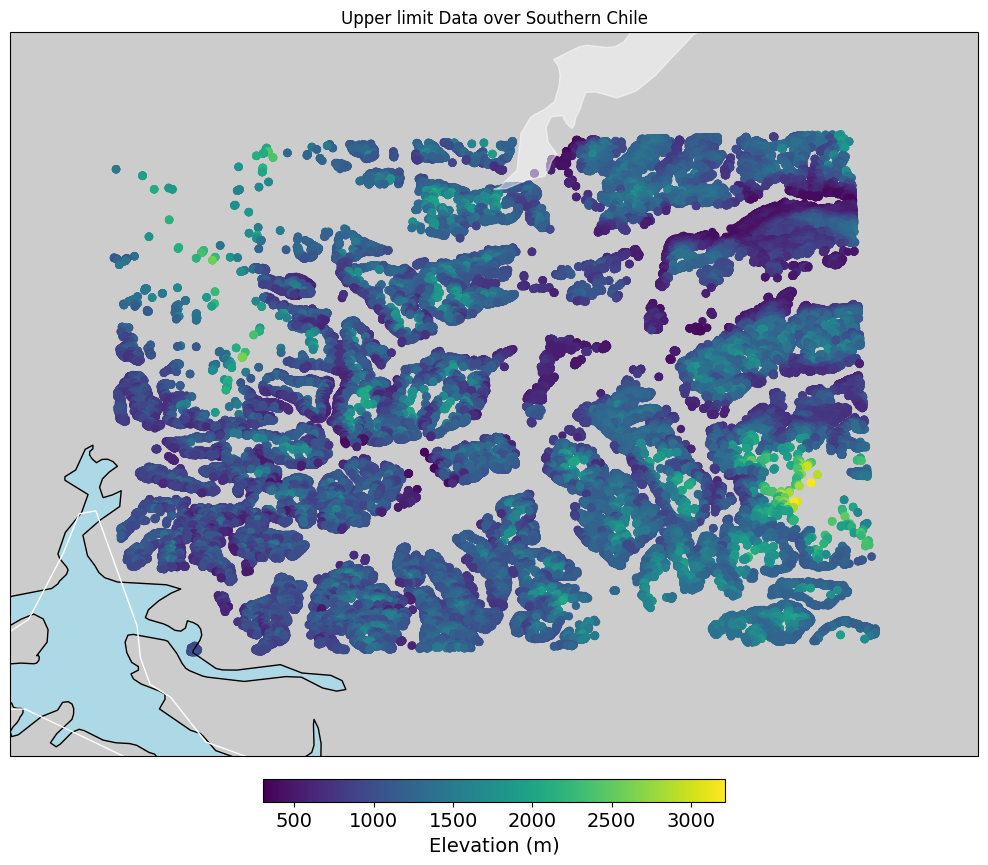

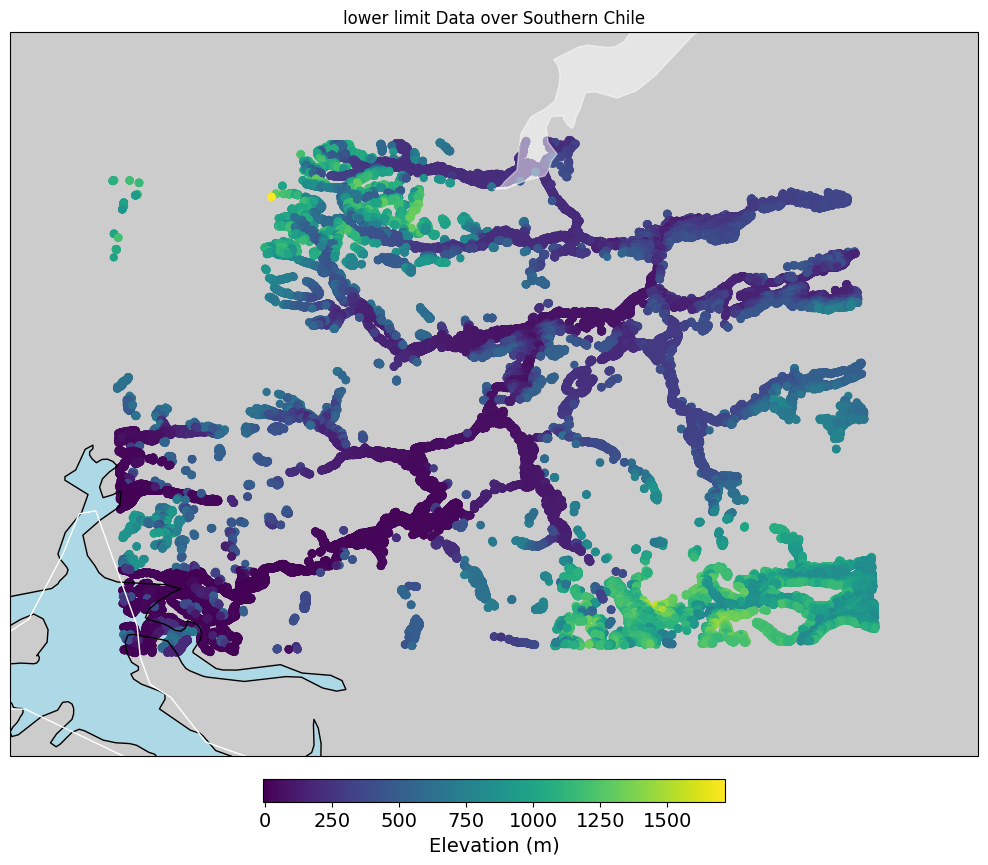

In [16]:
# Set up the map projection
projection = ccrs.PlateCarree()  # Simple lat/lon projection
extent = [lonmin-0.2, lonmax+0.2, latmin-0.2, latmax+0.2]    # Focus on southern Chile using the minimum and maximum lon and lats with a buffer

fig, ax = plt.subplots(figsize=(15, 10), subplot_kw={'projection': projection})
ax.coastlines(resolution='10m', color='black', linewidth=1)
ax.add_feature(cfeature.LAND, facecolor='lightgray')
ax.add_feature(cfeature.OCEAN, facecolor='lightblue')

plot_pcolormesh(ax, lonup, latup, elev_data_up.iloc[:,2],
                fig=fig,
                title="Upper limit Data over Southern Chile",
                extent=extent,
                cmap='viridis',
                scatter = True,
                cbar_label="Elevation (m)")

plt.show()

fig, ax = plt.subplots(figsize=(15, 10), subplot_kw={'projection': projection})
ax.coastlines(resolution='10m', color='black', linewidth=1)
ax.add_feature(cfeature.LAND, facecolor='lightgray')
ax.add_feature(cfeature.OCEAN, facecolor='lightblue')
plot_pcolormesh(ax, lonbot, latbot, elev_data_bot.iloc[:,2],
                fig=fig,
                title="lower limit Data over Southern Chile",
                extent=extent,
                cmap='viridis',
                scatter = True,
                cbar_label="Elevation (m)")

plt.show()

In [17]:
#Ensure dataframes appear as expected
print(dfup.head())
print(dfbot.head())

        xup        yup  tup     zup
0  632460.0  4799910.0  1.0  1194.0
1  632430.0  4799940.0  1.0  1258.0
2  632460.0  4799970.0  1.0  1163.0
3  632490.0  4799940.0  1.0  1194.0
4  632460.0  4799910.0  1.0  1194.0
       xbot       ybot  tbot    zbot
0  632550.0  4800000.0   1.0  1114.0
1  632520.0  4799970.0   1.0  1114.0
2  632670.0  4800000.0   1.0  1043.0
3  632670.0  4799940.0   1.0  1059.0
4  632640.0  4799910.0   1.0  1059.0


#**Set up model parameters**

In [18]:
expert_spacing = 6000 #local experts spaced every 6km
expert_x_range = [utm_xmin,utm_xmax]  #range of experts confined to range of the data
expert_y_range = [utm_ymin,utm_ymax]  #range of experts confined to range of the data
print(expert_x_range)
print(expert_y_range)

pred_spacing = 700  #Predicitons will be made every 700m

training_radius = 10_000  #distance away from expert location that can effect the training
inference_radius = 6_000  #radius that local expert can effect

projection = "utm"  # or "platecarree" if you're working purely in lat/lon


[598355.9733948591, 713624.5178487574]
[4690318.211715999, 4799817.011366315]


In [19]:
print((expert_x_range[1] - expert_x_range[0])/pred_spacing)
print((expert_y_range[1] - expert_y_range[0])/pred_spacing)

164.66934921985475
156.42685664330875


#Create lecal expert grid

In [20]:
xy_grid = grid_2d_flatten(x_range=expert_x_range,
                          y_range=expert_y_range,
                          step_size=expert_spacing)

# store in dataframe
eloc = pd.DataFrame(xy_grid, columns=['x', 'y'])

# add a time coordinate
eloc['t'] = np.floor(dfup['tup'].mean())

print("Local expert locations:")
eloc.head()

Local expert locations:


,x,y,t
0,601355.973395,4.693318e+06,1.0
1,607355.973395,4.693318e+06,1.0
2,613355.973395,4.693318e+06,1.0
3,619355.973395,4.693318e+06,1.0
4,625355.973395,4.693318e+06,1.0


#Plot local expert grid to check for unexpected things

               x             y    t        lon        lat
0  601355.973395  4.693318e+06  1.0 -73.643723 -47.905451
1  607355.973395  4.693318e+06  1.0 -73.563460 -47.904474
2  613355.973395  4.693318e+06  1.0 -73.483202 -47.903442
3  619355.973395  4.693318e+06  1.0 -73.402948 -47.902354
4  625355.973395  4.693318e+06  1.0 -73.322700 -47.901209


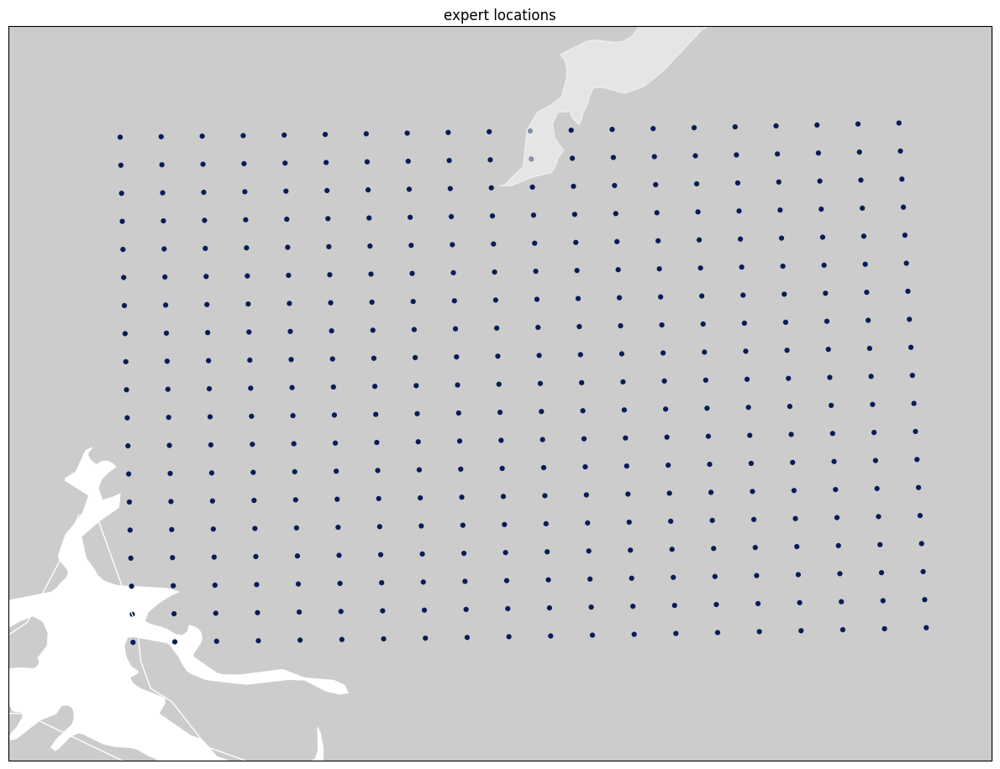

In [21]:
# plot expert locations
eloc['lon'], eloc['lat'] = UTM32718toWGS84(eloc['x'], eloc['y'])
print(eloc.head())

fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

plot_pcolormesh(ax=ax,
                lon=eloc['lon'],
                lat=eloc['lat'],
                plot_data=eloc['t'],
                title="expert locations",
                scatter=True,
                s=20,
                extent=extent)

plt.tight_layout()
plt.show()

#Repeart for prediction locations

In [22]:
pred_xy_grid = grid_2d_flatten(x_range=expert_x_range,
                               y_range=expert_y_range,
                               step_size=pred_spacing)

ploc = pd.DataFrame(pred_xy_grid, columns=['x', 'y'])

ploc['lon'], ploc['lat'] = UTM32718toWGS84(ploc['x'], ploc['y'])


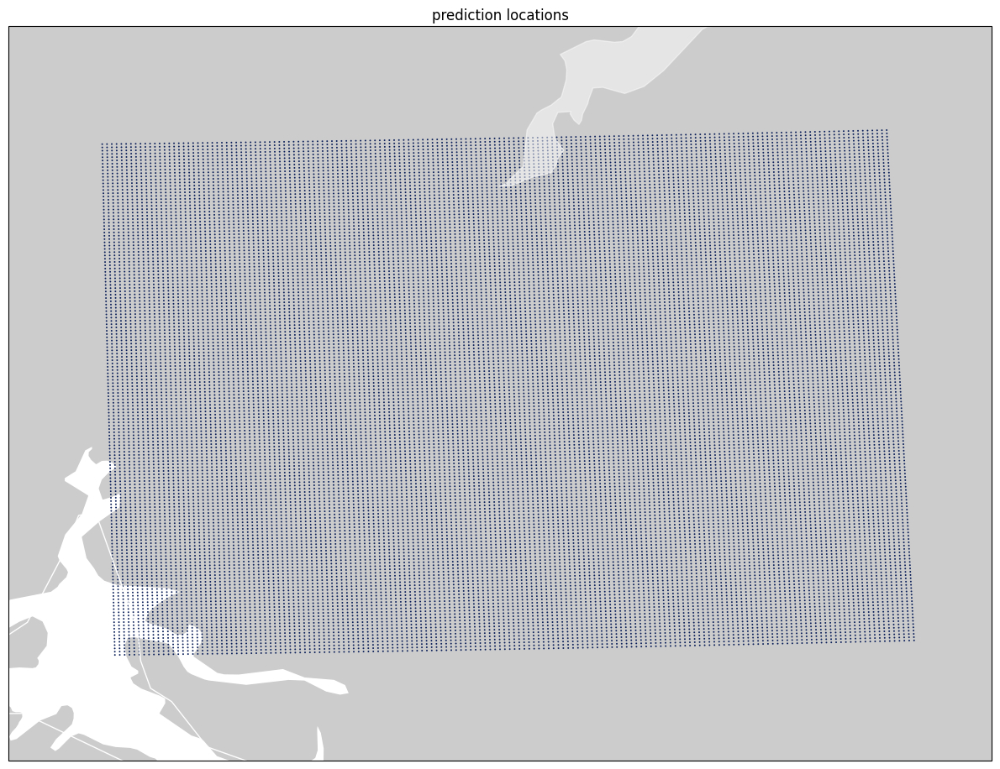

In [23]:
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

plot_pcolormesh(ax=ax,
                lon=ploc['lon'],
                lat=ploc['lat'],
                plot_data=np.full(len(ploc), 1.0), #np.arange(len(ploc)),
                title="prediction locations",
                scatter=True,
                s=2,
                extent=extent)

plt.tight_layout()
plt.show()


#We need to bin our data

In [24]:
bin_dselevup = DataPrep.bin_data_by(df=dfup,
                              by_cols=['tup'],
                              val_col='zup',
                              x_col='xup',
                              y_col='yup',
                              grid_res=500,
                              x_range=[x_min, x_max],
                              y_range=[y_min, y_max])

bin_dselevbot = DataPrep.bin_data_by(df=dfbot,
                              by_cols=['tbot'],
                              val_col='zbot',
                              x_col='xbot',
                              y_col='ybot',
                              grid_res=500,
                              x_range=[x_min, x_max],
                              y_range=[y_min, y_max])

# convert bin data to DataFrame
# - removing all the nans that would be added at grid locations away from data
bin_dfelevup = bin_dselevup.to_dataframe().dropna().reset_index()
bin_dfelevbot = bin_dselevbot.to_dataframe().dropna().reset_index()
bin_dfelevup.head()
bin_dfelevbot.head()

'bin_data_by': 0.054 seconds
'bin_data_by': 0.022 seconds


,ybot,xbot,tbot,zbot
0,4.690569e+06,600611.227525,1.0,11.750000
1,4.690569e+06,601112.395110,1.0,2.166667
2,4.690569e+06,601613.562695,1.0,4.210526
3,4.690569e+06,602114.730279,1.0,8.300000
4,4.690569e+06,602615.897864,1.0,1.666667


#View binned data

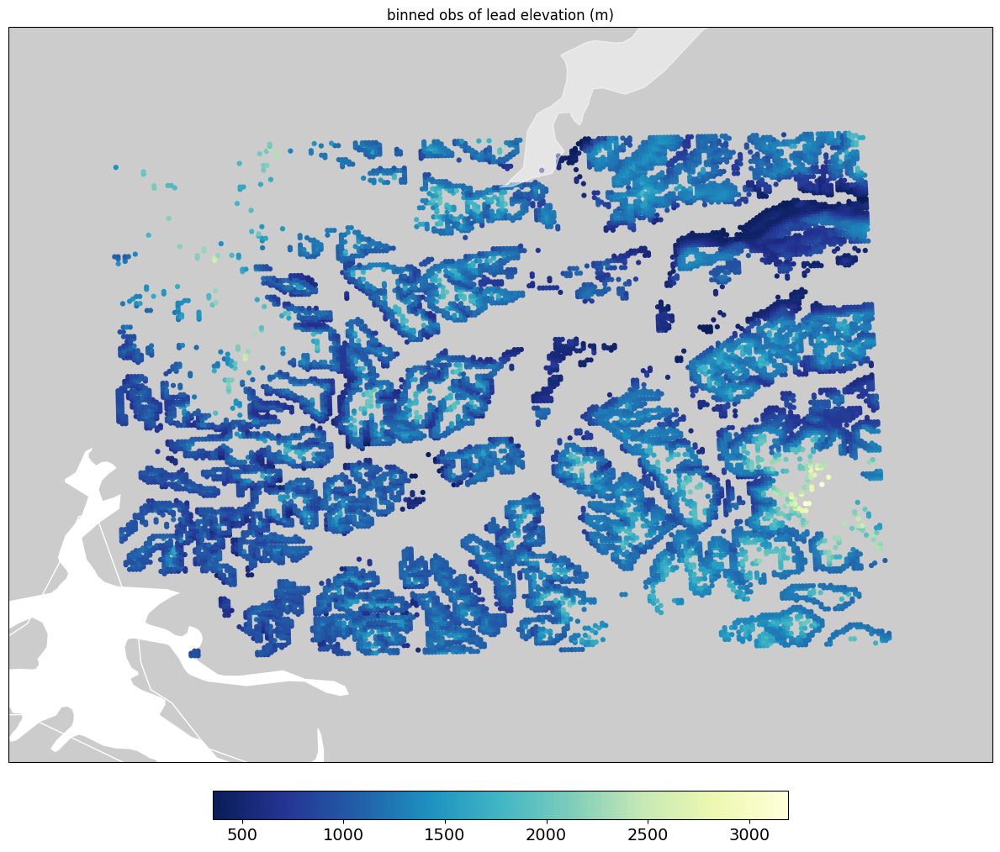

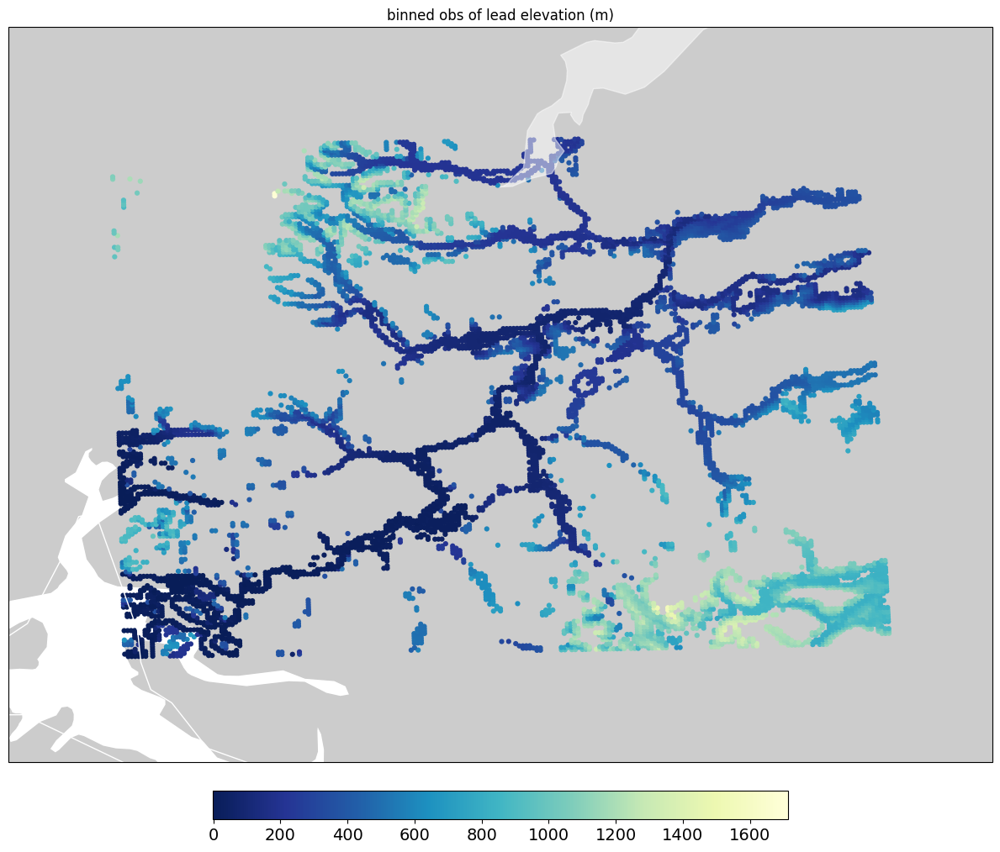

In [25]:
# this will plot all observations, some on top of each other
bin_dfelevup['lon'], bin_dfelevup['lat'] = UTM32718toWGS84(bin_dfelevup['xup'], bin_dfelevup['yup'])
bin_dfelevbot['lon'], bin_dfelevbot['lat'] = UTM32718toWGS84(bin_dfelevbot['xbot'], bin_dfelevbot['ybot'])
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
plot_pcolormesh(ax=ax,
                lon=bin_dfelevup['lon'],
                lat=bin_dfelevup['lat'],
                plot_data=bin_dfelevup['zup'],
                title="binned obs of lead elevation (m)",
                scatter=True,
                s=20,
                fig=fig,
                extent=extent)

plt.tight_layout()
plt.show()
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
plot_pcolormesh(ax=ax,
                lon=bin_dfelevbot['lon'],
                lat=bin_dfelevbot['lat'],
                plot_data=bin_dfelevbot['zbot'],
                title="binned obs of lead elevation (m)",
                scatter=True,
                s=20,
                fig=fig,
                extent=extent)

plt.tight_layout()
plt.show()

#**Parameter setup for GPsat**

In [26]:
# Change column names to just x,y,t
bin_dfelevup['x'] = bin_dfelevup['xup']
bin_dfelevup['y'] = bin_dfelevup['yup']
bin_dfelevup['t'] = bin_dfelevup['tup']
bin_dfelevbot['x'] = bin_dfelevbot['xbot']
bin_dfelevbot['y'] = bin_dfelevbot['ybot']
bin_dfelevbot['t'] = bin_dfelevbot['tbot']
datatop = {
    "data_source": bin_dfelevup,
    "obs_col": "zup",
    "coords_col": ["x", "y", "t"],
    # selection criteria used for each local expert
    "local_select": [
        {
            "col": "t",
            "comp": "<=",
            "val": 4
        },
        {
            "col": "t",
            "comp": ">=",
            "val": -4
        },
        {
            "col": [
                "x",
                "y"
            ],
            "comp": "<",
            "val": training_radius
        }
    ]
}
databot = {
    "data_source": bin_dfelevbot,
    "obs_col": "zbot",
    "coords_col": ["x", "y", "t"],
    # selection criteria used for each local expert
    "local_select": [
        {
            "col": "t",
            "comp": "<=",
            "val": 4
        },
        {
            "col": "t",
            "comp": ">=",
            "val": -4
        },
        {
            "col": [
                "x",
                "y"
            ],
            "comp": "<",
            "val": training_radius
        }
    ]
}
# local expert locations
local_expert = {
    "source": eloc
}

# model
model = {
    "oi_model": "GPflowSGPRModel",
    "init_params": {
        # scale (divide) coordinates
        "coords_scale": [5000, 5000, 1],
        "num_inducing_points": 100
        # can specify initial parameters values for model:
        # "noise_variance": 0.10,
        # "kernel_kwargs": {
        #     "lengthscales": [2.0, 2.0, 1.0],
        #     "variance": 0.05
        # }
    },
    # keyword arguments to be passed into each model/local expert's optimise_parameters method
    "optim_kwargs": {
        # parameters to be fixed (not trainable)
        # "fixed_params": ["likelihood_variance"]
    },
    "constraints": {
        # lengthscales - same order coord_col (see data)
        # - given in unscaled units
        "lengthscales": {
            "low": [1e-08, 1e-08, 1e-08],
            "high": [600000, 600000, 9]
        },
        "likelihood_variance": {
            "low": 0.00125,
            "high": 0.01
        }
    }
}

# prediction locations
pred_loc = {
    "method": "from_dataframe",
    "df": ploc,
    "max_dist": inference_radius
}

#**Run GPsat for elevation data both above and below our NDVI threshold**
This takes a LONG time

In [23]:
locexptop = LocalExpertOI(expert_loc_config=local_expert,
                       data_config=datatop,
                       model_config=model,
                       pred_loc_config=pred_loc)
locexpbot = LocalExpertOI(expert_loc_config=local_expert,
                       data_config=databot,
                       model_config=model,
                       pred_loc_config=pred_loc)

# run optimal interpolation
# - no predictions locations supplied
store_pathtop = get_parent_path("resultstop", "inline_exampletop.h5")
store_pathbot = get_parent_path("resultsbot", "inline_examplebot.h5")

# for the purposes of a simple example, if store_path exists: delete it
if os.path.exists(store_pathtop):
    cprint(f"removing: {store_pathtop}", "FAIL")
    os.remove(store_pathtop)
if os.path.exists(store_pathbot):
    cprint(f"removing: {store_pathbot}", "FAIL")
    os.remove(store_pathbot)

# run optimal interpolation
locexptop.run(store_path=store_pathtop,
           optimise=True,
           check_config_compatible=False)
locexpbot.run(store_path=store_pathbot,
           optimise=True,
           check_config_compatible=False)

Streaming output truncated to the last 5000 lines.
current local expert:
                 x             y    t        lon        lat
182  613355.973395  4.747318e+06  1.0 -73.497209 -47.417734
'local_data_select': 0.005 seconds
number obs: 70
setting lengthscales to: [1. 1. 1.]
number of inducing points is more than number of data points, setting inducing points to data points...
'__init__': 0.041 seconds
'set_lengthscales_constraints': 0.012 seconds
'set_likelihood_variance_constraints': 0.035 seconds
**********
optimization failed!
'optimise_parameters': 1.679 seconds
'optimise_parameters': 1.680 seconds
'get_parameters': 0.007 seconds
parameters:
lengthscales: array([0.26948053, 0.34319422, 1.        ]) 
kernel_variance: 39004.32568746883
likelihood_variance: 0.01
inducing_points: array([[122.12691584, 947.5568869 ,   1.        ],
       [122.22714936, 947.5568869 ,   1.        ],
       [122.32738288, 947.5568869 ,   1.        ],
       [122.42761639, 947.5568869 ,   1.        ],
 

#Extract results

In [24]:
# extract, store in dict
dfselevtop, oi_configelevtop = get_results_from_h5file(store_pathtop)
dfselevbot, oi_configelevbot = get_results_from_h5file(store_pathbot)

print(f"tables in results file: {list(dfselevtop.keys())}")
print(f"tables in results file: {list(dfselevbot.keys())}")

reading in results
getting all tables
merging on expert location data
table: 'oi_config' does not have all coords_col: ['x', 'y', 't'] in columns, not merging on expert_locations
reading in results
getting all tables
merging on expert location data
table: 'oi_config' does not have all coords_col: ['x', 'y', 't'] in columns, not merging on expert_locations
tables in results file: ['expert_locs', 'inducing_points', 'kernel_variance', 'lengthscales', 'likelihood_variance', 'oi_config', 'preds', 'run_details']
tables in results file: ['expert_locs', 'inducing_points', 'kernel_variance', 'lengthscales', 'likelihood_variance', 'oi_config', 'preds', 'run_details']


In [25]:
preds_dataelevtop = dfselevtop["preds"]
preds_dataelevbot = dfselevbot["preds"]

preds_dataelevtop.head()
preds_dataelevbot.head()

,x,y,t,_dim_0,f*,f*_var,y_var,f_bar,pred_loc_x,pred_loc_y,pred_loc_t,lon,lat
0,601355.973395,4.693318e+06,1.0,0,110.199607,10.700525,10.710525,0,598705.973395,4.690668e+06,1.0,-73.643723,-47.905451
1,601355.973395,4.693318e+06,1.0,1,71.704438,4.319004,4.329004,0,599405.973395,4.690668e+06,1.0,-73.643723,-47.905451
2,601355.973395,4.693318e+06,1.0,2,30.560277,1.773456,1.783456,0,600105.973395,4.690668e+06,1.0,-73.643723,-47.905451
3,601355.973395,4.693318e+06,1.0,3,0.472033,0.627674,0.637674,0,600805.973395,4.690668e+06,1.0,-73.643723,-47.905451
4,601355.973395,4.693318e+06,1.0,4,2.620165,0.095002,0.105002,0,601505.973395,4.690668e+06,1.0,-73.643723,-47.905451


#Glue predictions together

In [34]:
# multiple local experts may make predictions at the same prediction location (pred_loc).
# - for each prediction at a given location, take we weighted combination
# - weights being a function of the distance to each local expert that made a prediction at a given location.

plt_dataelevtop = glue_local_predictions_2d(preds_df=preds_dataelevtop,
                                     pred_loc_cols=["pred_loc_x", "pred_loc_y"],
                                     xprt_loc_cols=["x", "y"],
                                     vars_to_glue=["f*", "f*_var"],
                                     inference_radius=inference_radius)
plt_dataelevbot = glue_local_predictions_2d(preds_df=preds_dataelevbot,
                                     pred_loc_cols=["pred_loc_x", "pred_loc_y"],
                                     xprt_loc_cols=["x", "y"],
                                     vars_to_glue=["f*", "f*_var"],
                                     inference_radius=inference_radius)
plt_dataelevtop.head()
plt_dataelevbot.head()

,pred_loc_x,pred_loc_y,f*,f*_var
0,598705.973395,4.690668e+06,110.199607,10.700525
1,598705.973395,4.691368e+06,115.209128,6.801753
2,598705.973395,4.692068e+06,202.398685,10.316035
3,598705.973395,4.692768e+06,386.749074,7.562108
4,598705.973395,4.693468e+06,524.634804,8.552726


#Save our GPsat predictions
**Important as this means running the whole model again is unnecessary**

In [ ]:

# Replace 'YourFolder' with a folder name in your Drive
save_path1 = '/content/drive/MyDrive/GEOL0069/Final Project/Data/'

# Make sure the directory exists
os.makedirs(save_path1, exist_ok=True)

# Save the CSVs
plt_dataelevtop.to_csv(f'{save_path1}/elevpredtop.csv', index=False)
plt_dataelevbot.to_csv(f'{save_path1}/elevpredbot.csv', index=False)


#Load our saved data

In [27]:
save_path1 = '/content/drive/MyDrive/GEOL0069/Final Project/Data/'
plt_dataelevtop = pd.read_csv(save_path1+'elevpredtop.csv')
plt_dataelevbot = pd.read_csv(save_path1+'elevpredbot.csv')

#**Plot our GPsat predictions**
These are interpolation predictions of the elevation of corresponding to the NDVI contour

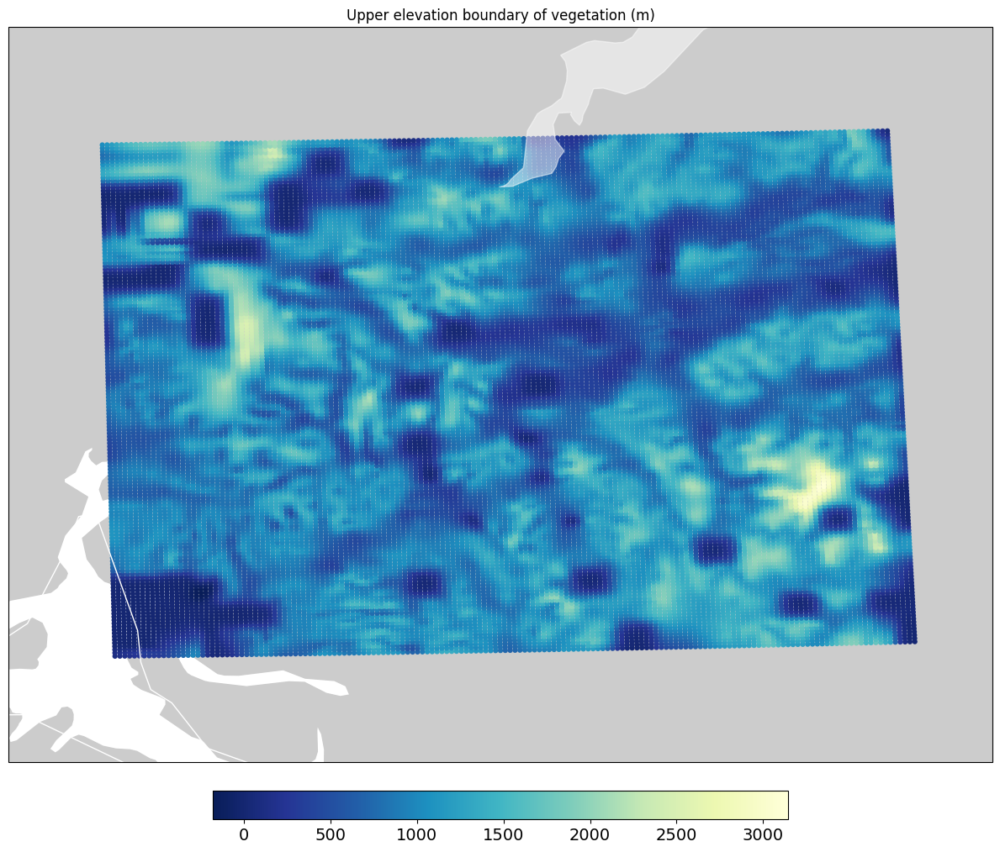

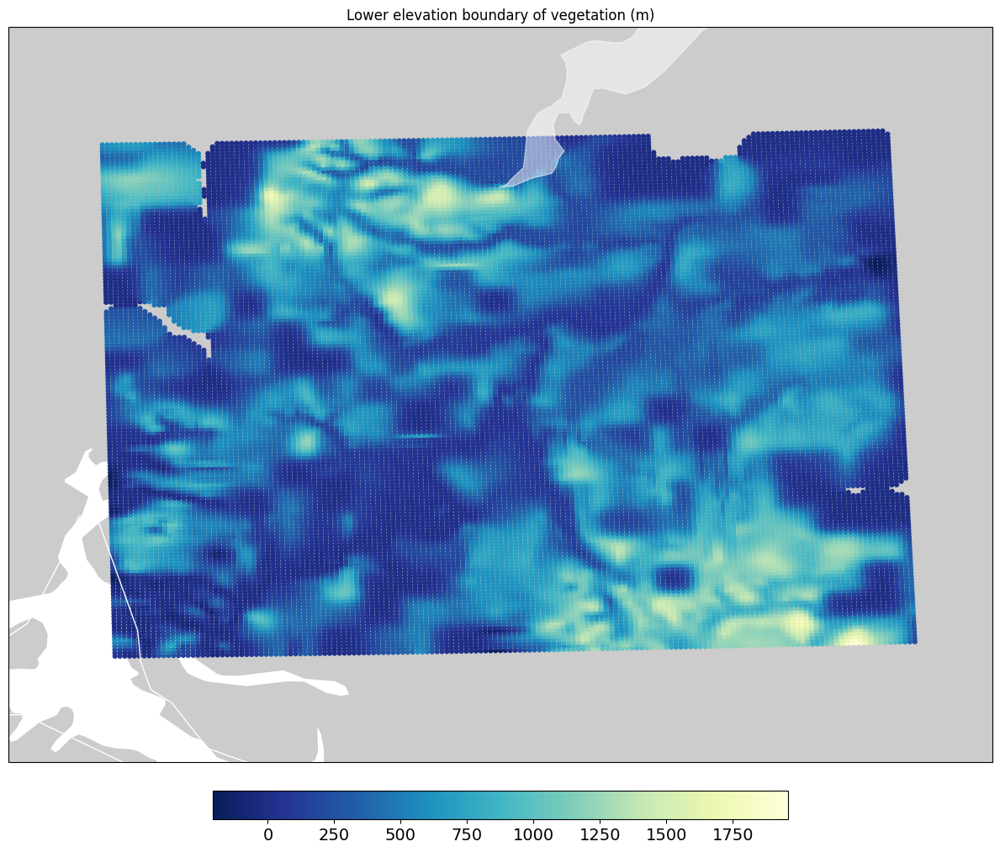

In [49]:
# this will plot all observations, some on top of each other
plt_dataelevtop['lon'], plt_dataelevtop['lat'] = UTM32718toWGS84(plt_dataelevtop['pred_loc_x'], plt_dataelevtop['pred_loc_y'])
plt_dataelevbot['lon'], plt_dataelevbot['lat'] = UTM32718toWGS84(plt_dataelevbot['pred_loc_x'], plt_dataelevbot['pred_loc_y'])


fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

plot_pcolormesh(ax=ax,
                lon=plt_dataelevtop['lon'],
                lat=plt_dataelevtop['lat'],
                plot_data=plt_dataelevtop['f*'],
                title="Upper elevation boundary of vegetation (m)",
                scatter=True,
                s=20,
                fig=fig,
                extent=extent)

plt.tight_layout()
plt.show()
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

plot_pcolormesh(ax=ax,
                lon=plt_dataelevbot['lon'],
                lat=plt_dataelevbot['lat'],
                plot_data=plt_dataelevbot['f*'],
                title="Lower elevation boundary of vegetation (m)",
                scatter=True,
                s=20,
                fig=fig,
                extent=extent)

plt.tight_layout()
plt.show()

#Calculate the difference between upper and lower contours

In [29]:
bothpred = pd.merge(plt_dataelevtop, plt_dataelevbot, on=['pred_loc_x', 'pred_loc_y','lon','lat'], suffixes=('_top', '_bot'))
bothpred['diff'] = bothpred['f*_top'] - bothpred['f*_bot']
bothpred.head()

,pred_loc_x,pred_loc_y,f*_top,f*_var_top,lon,lat,f*_bot,f*_var_bot,diff
0,598705.973395,4.690668e+06,116.013833,67088.875171,-73.678566,-47.929700,110.199607,10.700525,5.814227
1,598705.973395,4.691368e+06,136.414267,67295.332463,-73.678727,-47.923404,115.209128,6.801753,21.205138
2,598705.973395,4.692068e+06,93.012556,68913.409790,-73.678887,-47.917108,202.398685,10.316035,-109.386129
3,598705.973395,4.692768e+06,24.317162,69761.138346,-73.679047,-47.910811,386.749074,7.562108,-362.431913
4,598705.973395,4.693468e+06,3.906602,69820.430363,-73.679208,-47.904515,524.634804,8.552726,-520.728203


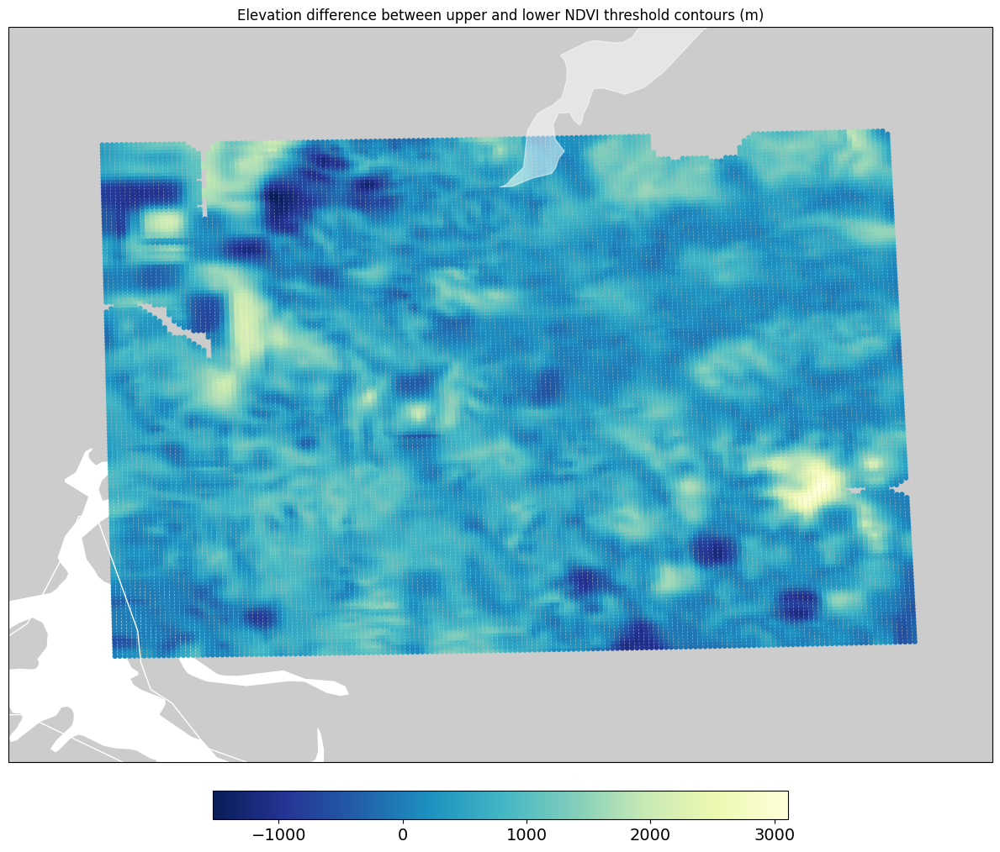

In [45]:
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

plot_pcolormesh(ax=ax,
                lon=bothpred['lon'],
                lat=bothpred['lat'],
                plot_data=bothpred['diff'],
                title="Elevation difference between upper and lower NDVI threshold contours (m)",
                scatter=True,
                s=20,
                fig=fig,
                extent=extent)

plt.tight_layout()
plt.show()

# Plot the variance and log(variance) of the predictions

/usr/local/lib/python3.11/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


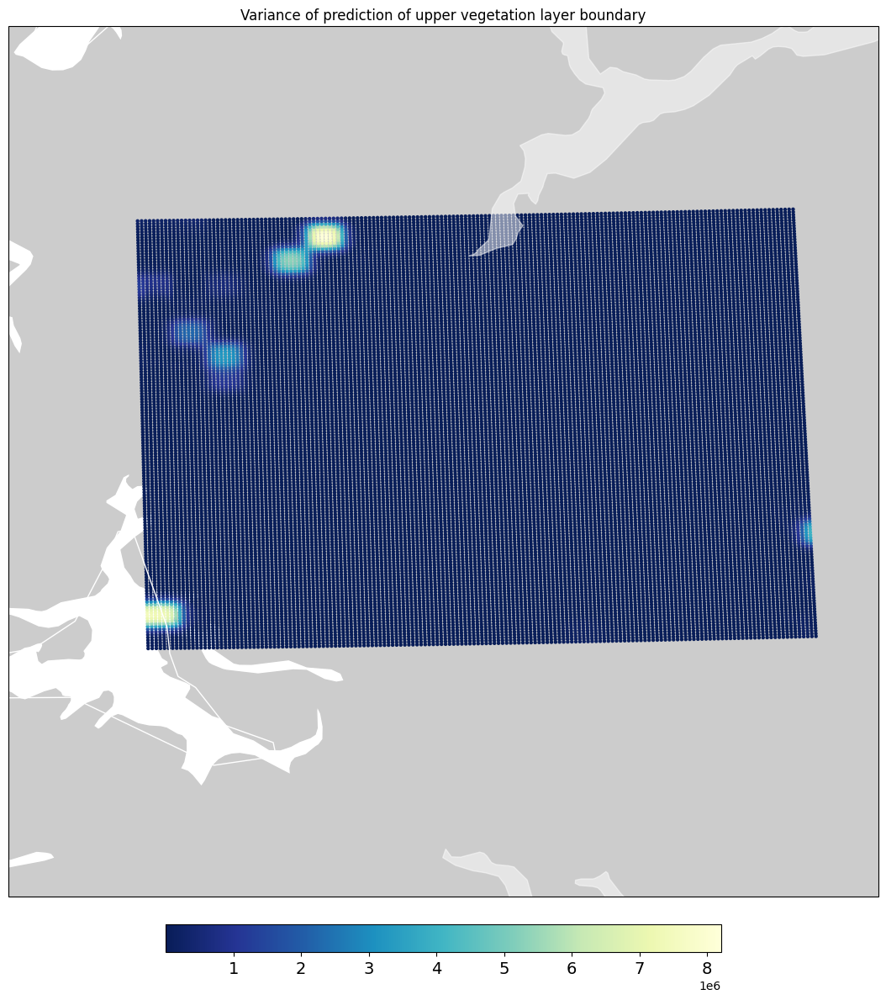

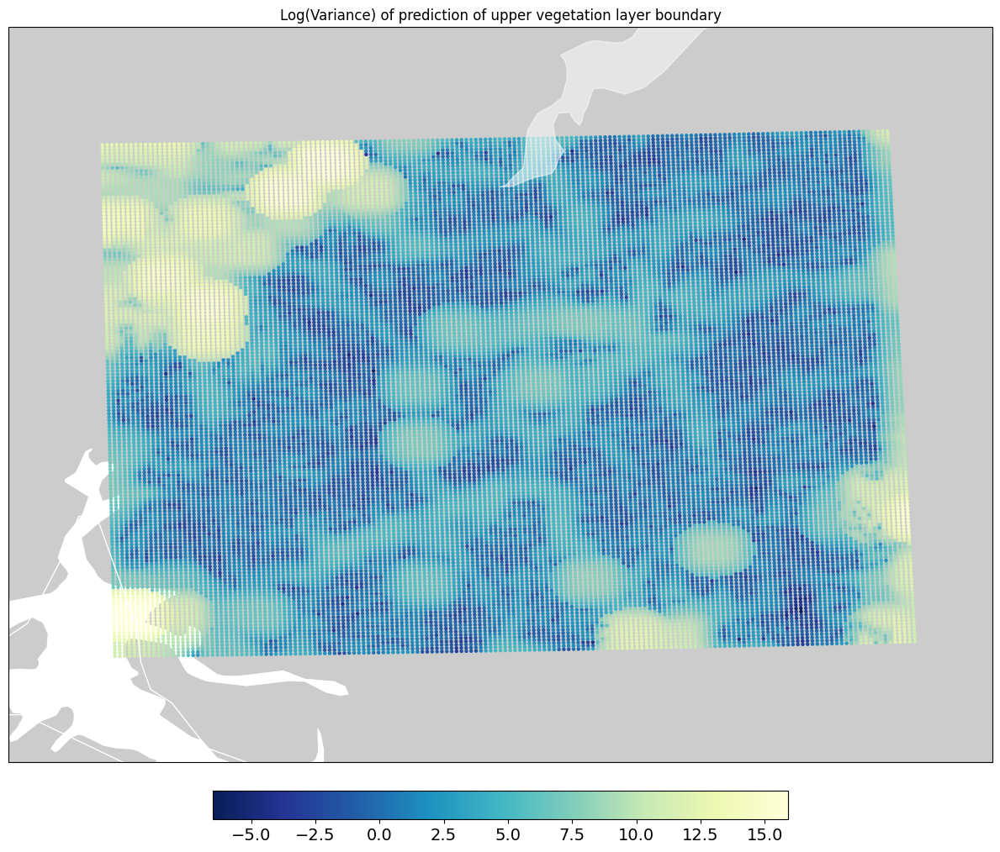

In [47]:
plt_dataelevtop['logvar'] = np.log(plt_dataelevtop['f*_var'])
plt_dataelevbot['logvar'] = np.log(plt_dataelevbot['f*_var'])

fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

plot_pcolormesh(ax=ax,
                lon=plt_dataelevtop['lon'],
                lat=plt_dataelevtop['lat'],
                plot_data=plt_dataelevtop['f*_var'],
                title="Variance of prediction of upper vegetation layer boundary",
                scatter=True,
                s=10,
                fig=fig,
                extent=[-74.0, -72.0, -48.5, -46.5])

plt.tight_layout()
plt.show()
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

plot_pcolormesh(ax=ax,
                lon=plt_dataelevtop['lon'],
                lat=plt_dataelevtop['lat'],
                plot_data=plt_dataelevtop['logvar'],
                title="Log(Variance) of prediction of upper vegetation layer boundary",
                scatter=True,
                s=10,
                fig=fig,
                extent=extent)

plt.tight_layout()
plt.show()

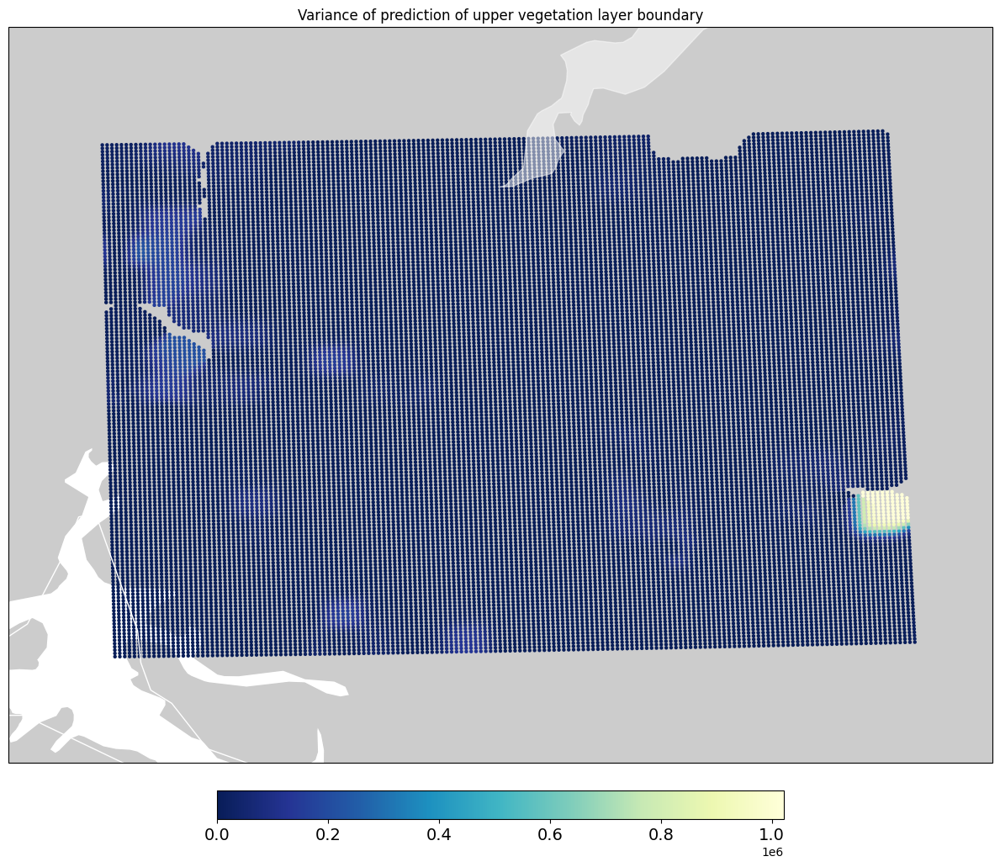

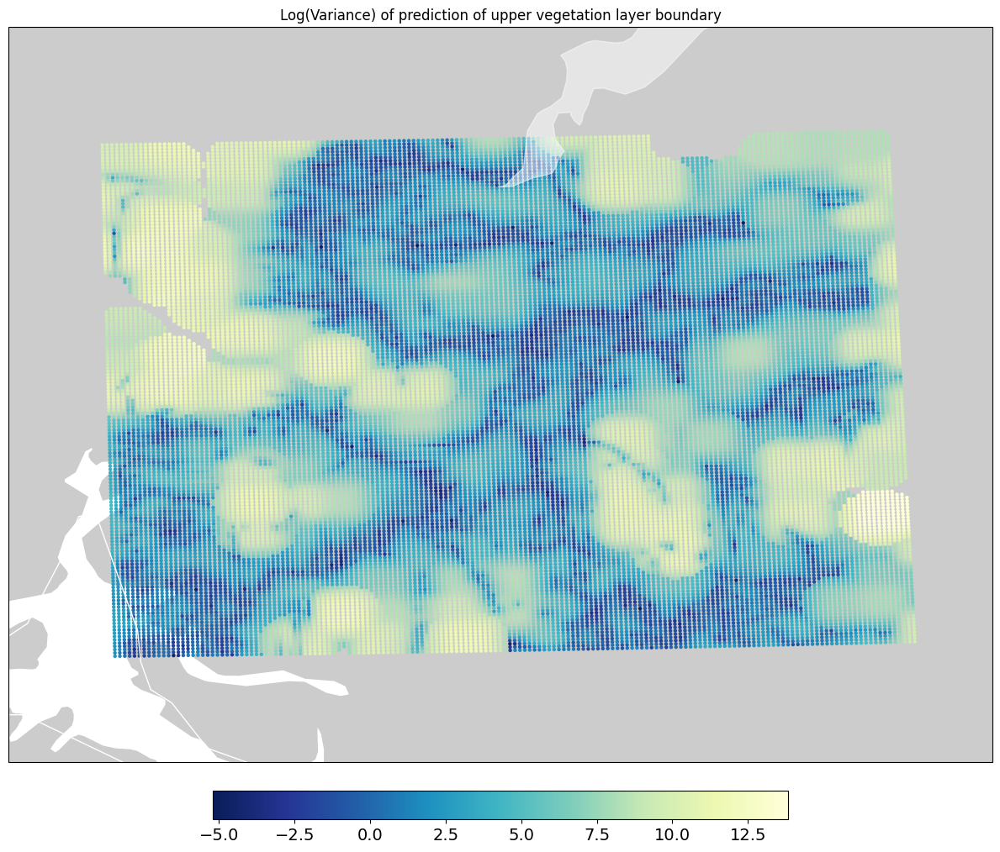

In [48]:
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

plot_pcolormesh(ax=ax,
                lon=plt_dataelevbot['lon'],
                lat=plt_dataelevbot['lat'],
                plot_data=plt_dataelevbot['f*_var'],
                title="Variance of prediction of upper vegetation layer boundary",
                scatter=True,
                s=10,
                fig=fig,
                extent=extent)

plt.tight_layout()
plt.show()
fig = plt.figure(figsize=(12, 12))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

plot_pcolormesh(ax=ax,
                lon=plt_dataelevbot['lon'],
                lat=plt_dataelevbot['lat'],
                plot_data=plt_dataelevbot['logvar'],
                title="Log(Variance) of prediction of upper vegetation layer boundary",
                scatter=True,
                s=10,
                fig=fig,
                extent=extent)

plt.tight_layout()
plt.show()